In [ ]:
from google.colab import drive
drive.mount('/content/drive/')
# %mkdir /content/drive/MyDrive/myNewfolder
%cd /content/drive/MyDrive

Mounted at /content/drive/
/content/drive/MyDrive


In [ ]:
import torch
import numpy as np

# check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
  print('CUDA is not available.  Training on CPU ...')
else:
  print('CUDA is available!  Training on GPU ...')

CUDA is available!  Training on GPU ...


['side-road-left', 'gap-in-median', 'right-hand-curve', 'left-hand-curve']


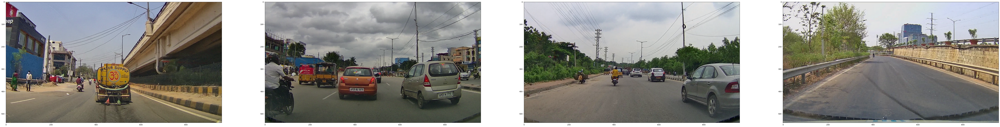

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import os
src_path = "/content/drive/MyDrive/task2train540p/"
sub_class = os.listdir(src_path)
print(sub_class)
lhc = os.listdir(os.path.join(src_path,sub_class[0]))
gip = os.listdir(os.path.join(src_path,sub_class[1]))
srl = os.listdir(os.path.join(src_path,sub_class[2]))
rhc = os.listdir(os.path.join(src_path,sub_class[3]))

fig = plt.figure(figsize=(100,100))
path = os.path.join(src_path,sub_class[0])
for i in range(0,1):
    plt.subplot(240 + 1 + i)
    img = plt.imread(os.path.join(path,lhc[0]))
    plt.imshow(img, cmap=plt.get_cmap('gray'))
path = os.path.join(src_path,sub_class[1])
for i in range(0,1):
    plt.subplot(240 + 2 + i)
    img = plt.imread(os.path.join(path,gip[0]))
    plt.imshow(img, cmap=plt.get_cmap('gray'))
path = os.path.join(src_path,sub_class[2])
for i in range(0,1):
    plt.subplot(240 + 3 + i)
    img = plt.imread(os.path.join(path,srl[0]))
    plt.imshow(img, cmap=plt.get_cmap('gray'))
path = os.path.join(src_path,sub_class[3])
for i in range(0,1):
    plt.subplot(240 + 4 + i)
    img = plt.imread(os.path.join(path,rhc[0]))
    plt.imshow(img, cmap=plt.get_cmap('gray'))

In [ ]:
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import DataLoader

# number of subprocesses to use for data loading
num_workers = 0
# how many samples per batch to load
batch_size = 2
# percentage of training set to use as validation
valid_size = 0.2

# convert data to a normalized torch.FloatTensor
print('==> Preparing data..')
#Image augmentation is used to train the model
transform_train = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])
#Only the data is normalaized we do not need to augment the test data
transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

# choose the training and test datasets
train_data = datasets.ImageFolder("/content/drive/MyDrive/task2train540p", transform=transform_train)
# test_data = datasets.ImageFolder(r"E:\finalframesWithBBs\Test_Images", transform=transform_test) ###########################test


# obtain training indices that will be used for validation
num_train = len(train_data)
indices = list(range(num_train))
np.random.shuffle(indices)
split = int(np.floor(valid_size * num_train))
train_idx, valid_idx = indices[split:], indices[:split]

# define samplers for obtaining training and validation batches
train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

# prepare data loaders (combine dataset and sampler)
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size,
    sampler=train_sampler, num_workers=num_workers)
valid_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, 
    sampler=valid_sampler, num_workers=num_workers)
# test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, num_workers=num_workers)  ##########################test

# specify the image classes
classes = ['gap-in-median','left-hand-curve','right-hand-curve','side-road-left']

==> Preparing data..


In [ ]:
import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.nn.functional as F

class BasicBlock(nn.Module):
  expansion = 1
  def __init__(self, in_planes, planes, stride=1):
    super(BasicBlock, self).__init__()
    self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
    self.bn1 = nn.BatchNorm2d(planes)
    self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
    self.bn2 = nn.BatchNorm2d(planes)

    self.shortcut = nn.Sequential()
    if stride != 1 or in_planes != self.expansion*planes:
      self.shortcut = nn.Sequential(
          nn.Conv2d(in_planes, self.expansion*planes, kernel_size=1, stride=stride, bias=False),
          nn.BatchNorm2d(self.expansion*planes)
      )
  
  def forward(self, x):
    out = F.relu(self.bn1(self.conv1(x)))
    out = self.bn2(self.conv2(out))
    out += self.shortcut(x)
    out = F.relu(out)
    return out

class BottleNeck(nn.Module):
  expansion = 4

  def __init__(self, in_planes, planes, stride=1):
    super(BottleNeck, self).__init__()
    self.conv1 = nn.Conv2d(in_planes , planes, kernel_size=1, bias=False)
    self.bn1 = nn.BatchNorm2d(planes)
    self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
    self.bn2 = nn.BatchNorm2d(planes)
    self.conv3 = nn.Conv2d(planes, self.expansion*planes, kernel_size=1, bias=False)
    self.bn3 = nn.BatchNorm2d(self.expansion*planes)

    self.shortcut = nn.Sequential()
    if stride != 1 or in_planes != self.expansion*planes :
      self.shortcut = nn.Sequential(
          nn.Conv2d(in_planes, self.expansion*planes, kernel_size=1, stride=stride, bias=False),
          nn.BatchNorm2d(self.expansion*planes)
      )

  def forward(self, x):
    out = F.relu(self.bn1(self.conv1(x)))
    out = F.relu(self.bn2(self.conv2(out)))
    out = self.bn3(self.conv3(out))
    out += self.shortcut(x)
    out = F.relu(out)
    return out

class ResNet(nn.Module):
  def __init__(self, block, num_blocks, num_classes=4):
    super(ResNet, self).__init__()
    self.in_planes = 64

    self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
    self.bn1 = nn.BatchNorm2d(64)
    self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
    self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
    self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
    self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
    self.linear = nn.Linear(512*4, num_classes)

  def _make_layer(self, block, planes, num_blocks, stride):
    strides = [stride] + [1]*(num_blocks-1)
    layers = []
    for stride in strides:
      layers.append(block(self.in_planes, planes, stride))
      self.in_planes = planes * block.expansion      
    return nn.Sequential(*layers)

  def forward(self, x):
    # print(x.shape)
    out = F.relu(self.bn1(self.conv1(x)))
    out = self.layer1(out)
    out = self.layer2(out)
    out = self.layer3(out)
    out = self.layer4(out)
    out = F.avg_pool2d(out, (17,30))
    out = out.view(out.size(0), -1)
    out = self.linear(out)
    return out

ResNet18 = ResNet(BasicBlock, [2,2,2,2])
#ResNet34 = ResNet(BasicBlock, [3,4,6,3])
#ResNet50 = ResNet(BottleNeck, [3,4,6,3])
#ResNet101 = ResNet(BottleNeck, [3,4,23,3])
#ResNet152 = ResNet(BottleNeck, [3,8,36,3])

print(ResNet18)

if train_on_gpu:
  ResNet18 = torch.nn.DataParallel(ResNet18)
  cudnn.benchmark = True

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=

In [ ]:
import torch.optim as optim
# specify loss function (categorical cross-entropy)
criterion = nn.CrossEntropyLoss()

# specify optimizer
optimizer = optim.SGD(ResNet18.parameters(), lr=0.0001, momentum=0.9, weight_decay=0.01)

In [ ]:
# number of epochs to train the model
n_epochs = 100

Resnet18 = torch.load("ResNet18.pt")

valid_loss_min = np.Inf # track change in validation loss


for epoch in range(1, n_epochs+1):
  # keep track of training and validation loss
  train_loss = 0.0
  valid_loss = 0.0
    
  ###################
  # train the model #
  ###################
  ResNet18.train()
  for batch_idx, (data, target) in enumerate(train_loader):
    # move tensors to GPU if CUDA is available
    if train_on_gpu:
      data, target = data.cuda(), target.cuda()
    # clear the gradients of all optimized variables
    optimizer.zero_grad()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = ResNet18(data)
    # calculate the batch loss
    loss = criterion(output, target)
    # backward pass: compute gradient of the loss with respect to model parameters
    loss.backward()
    # perform a single optimization step (parameter update)
    optimizer.step()
    # update training loss
    train_loss += loss.item()*data.size(0)
        
  ######################    
  # validate the model #
  ######################
  ResNet18.eval()
  for batch_idx, (data, target) in enumerate(valid_loader):
    # move tensors to GPU if CUDA is available
    if train_on_gpu:
      data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = ResNet18(data)
    # calculate the batch loss
    loss = criterion(output, target)
    # update average validation loss 
    valid_loss += loss.item()*data.size(0)
    
  # calculate average losses
  train_loss = train_loss/len(train_loader.sampler)
  valid_loss = valid_loss/len(valid_loader.sampler)
        
  # print training/validation statistics 
  print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
      epoch, train_loss, valid_loss))
    
  # save model if validation loss has decreased
  if valid_loss <= valid_loss_min:
    print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
    valid_loss_min,
    valid_loss))
    torch.save(ResNet18.state_dict(), 'ResNet18.pt')
    valid_loss_min = valid_loss

Epoch: 1 	Training Loss: 1.417094 	Validation Loss: 1.405185
Validation loss decreased (inf --> 1.405185).  Saving model ...
Epoch: 2 	Training Loss: 1.289409 	Validation Loss: 1.306410
Validation loss decreased (1.405185 --> 1.306410).  Saving model ...
Epoch: 3 	Training Loss: 1.213916 	Validation Loss: 1.419052
Epoch: 4 	Training Loss: 1.155314 	Validation Loss: 1.383794
Epoch: 5 	Training Loss: 1.113926 	Validation Loss: 1.235564
Validation loss decreased (1.306410 --> 1.235564).  Saving model ...
Epoch: 6 	Training Loss: 1.070906 	Validation Loss: 1.220188
Validation loss decreased (1.235564 --> 1.220188).  Saving model ...
Epoch: 7 	Training Loss: 1.054738 	Validation Loss: 1.543604
Epoch: 8 	Training Loss: 1.033524 	Validation Loss: 1.097794
Validation loss decreased (1.220188 --> 1.097794).  Saving model ...
Epoch: 9 	Training Loss: 0.988487 	Validation Loss: 1.381995
Epoch: 10 	Training Loss: 0.957521 	Validation Loss: 1.243681
Epoch: 11 	Training Loss: 0.879859 	Validation Lo

KeyboardInterrupt: ignored

In [ ]:
ResNet18.load_state_dict(torch.load('ResNet18.pt'))

<All keys matched successfully>

In [16]:
import torch
import numpy as np

test_data = datasets.ImageFolder("/content/drive/MyDrive/task2test", transform=transform_test)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, num_workers=num_workers)

test_loss = 0.0
class_correct = list(0. for i in range(4))
class_total = list(0. for i in range(4))

ResNet18.eval()
# iterate over test data
for batch_idx, (data, target) in enumerate(test_loader):   ####### test_loader ==> train_loader
  # move tensors to GPU if CUDA is available
  if train_on_gpu:
    data, target = data.cuda(), target.cuda()
  # forward pass: compute predicted outputs by passing inputs to the model
  output = ResNet18(data)
  # calculate the batch loss
  loss = criterion(output, target)
  # update test loss 
  test_loss += loss.item()*data.size(0)
  # convert output probabilities to predicted class
  _, pred = torch.max(output, 1)    
  # compare predictions to true label
  correct_tensor = pred.eq(target.data.view_as(pred))
  # print(pred, target)
  correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())
  # calculate test accuracy for each object class
  # print(len(target.data))
  for i in range(len(target.data)):
    label = target.data[i]
    print(label)
    print(class_correct)
    print(class_total)
    class_correct[label] += correct[i].item()
    class_total[label] += 1
    #print(label, class_correct[label] )

# average test loss
test_loss = test_loss/len(test_loader.dataset)    ####### test_loader ==> train_loader
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(4):
  if class_total[i] > 0:
    print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
        classes[i], 100 * class_correct[i] / class_total[i],
        np.sum(class_correct[i]), np.sum(class_total[i])))
  else:
    print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))

tensor(0, device='cuda:0')
[0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[1.0, 0.0, 0.0, 0.0]
[1.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[2.0, 0.0, 0.0, 0.0]
[2.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[2.0, 0.0, 0.0, 0.0]
[3.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[3.0, 0.0, 0.0, 0.0]
[4.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[4.0, 0.0, 0.0, 0.0]
[5.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[4.0, 0.0, 0.0, 0.0]
[6.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[5.0, 0.0, 0.0, 0.0]
[7.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[6.0, 0.0, 0.0, 0.0]
[8.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[7.0, 0.0, 0.0, 0.0]
[9.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[8.0, 0.0, 0.0, 0.0]
[10.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[9.0, 0.0, 0.0, 0.0]
[11.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[10.0, 0.0, 0.0, 0.0]
[12.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[11.0, 0.0, 0.0, 0.0]
[13.0, 0.0, 0.0, 0.0]
tensor(0, device='cuda:0')
[

IndexError: ignored